# Default parameters

## Load dataset and define pipeline
Define each pipeline once for all datasets to avoid load checkpoints several times!! 

In [1]:
import os
import glob
import zipfile
from tqdm import tqdm
from sentence_transformers import util

In [2]:
import sys
sys.path.append("../src")

from utils import ImageTopicExtractor, set_topic_explainer_pipe, set_image_sumarizer_pipe

/ext3/miniconda3/lib/python3.12/site-packages/dask/dataframe/__init__.py:31: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


In [3]:
%load_ext autoreload
%autoreload 2

In [4]:
# Flickr 8k images
img_folder = '../../photos/'
caps_folder = '../../captions/'

if not os.path.exists(img_folder) or len(os.listdir(img_folder)) == 0:
    os.makedirs(img_folder, exist_ok=True)

    if not os.path.exists('Flickr8k_Dataset.zip'):   #Download dataset if does not exist
        util.http_get('https://github.com/jbrownlee/Datasets/releases/download/Flickr8k/Flickr8k_Dataset.zip', 'Flickr8k_Dataset.zip')
        util.http_get('https://github.com/jbrownlee/Datasets/releases/download/Flickr8k/Flickr8k_text.zip', 'Flickr8k_text.zip')

    for folder, file in [(img_folder, 'Flickr8k_Dataset.zip'), (caps_folder, 'Flickr8k_text.zip')]:
        with zipfile.ZipFile(file, 'r') as zf:
            for member in tqdm(zf.infolist(), desc='Extracting'):
                zf.extract(member, folder)

images = list(glob.glob(f'{img_folder}Flicker8k_Dataset/*.jpg'))

In [5]:
topic_explainer_pipe = set_topic_explainer_pipe()

`low_cpu_mem_usage` was None, now set to True since model is quantized.


Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


In [6]:
dataset_summary_pipe, tokenizer = set_image_sumarizer_pipe()

Token has not been saved to git credential helper. Pass `add_to_git_credential=True` if you want to set the git credential as well.
Token is valid (permission: read).
Your token has been saved to /home/gv2167/.cache/huggingface/token
Login successful


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

## Call topic_extractor 

In [7]:
# code to run with precomputed embeddings and clusters

# load_folder = '../../saved_embeddings/'
# topic_extractor = Image_Topic_Extractor(img_list = images,
                 # clusters = load_folder + 'clusters.npy' ,
                 # embeddings = load_folder + 'embeddings.npy',
                 # reduced_embeddings = load_folder + 'reduced_embeddings.npy',
                 # reduced_embeddings_2d = load_folder + '2d_embeddings.npy')

topic_extractor = ImageTopicExtractor(img_list = images)

topic_extractor.fit(topic_explainer_pipe = topic_explainer_pipe)
description = topic_extractor.get_final_description(dataset_summary_pipe = dataset_summary_pipe, tokenizer= tokenizer)
print(description)

Could not find image processor class in the image processor config or the model config. Loading based on pattern matching with the model's feature extractor configuration. Please open a PR/issue to update `preprocessor_config.json` to use `image_processor_type` instead of `feature_extractor_type`. This warning will be removed in v4.40.
2024-05-03 13:08:00,585 - BERTopic - Embedding - Transforming documents to embeddings.
100%|██████████████████████████████████████████████████████| 253/253 [06:21<00:00,  1.51s/it]
2024-05-03 13:14:22,181 - BERTopic - Embedding - Completed ✓
2024-05-03 13:14:22,181 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
/ext3/miniconda3/lib/python3.12/site-packages/numba/np/ufunc/parallel.py:371: NumbaWarning: The TBB threading layer requires TBB version 2021 update 6 or later i.e., TBB_INTERFACE_VERSION >= 12060. Found TBB_INTERFACE_VERSION = 12050. The TBB threading layer is disabled.
  warnings.warn(problem)
2024-05-03 13:14:48,14


         This dataset is an extensive collection of images featuring various topics. The largest group within the dataset is dedicated to skateboarding and swimming, with a total of 5942 images showcasing these activities from different angles and perspectives. In addition, there are 2069 images of dogs playing frisbee in grass, highlighting the playful nature of canine companions. These images provide a comprehensive overview of two popular recreational activities and the joyful interactions between pets and their owners.


## Visualizations

In [8]:
from IPython.core.display import display, HTML

/state/partition1/job-46019404/ipykernel_1633500/2058709175.py:1: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


In [9]:
df = topic_extractor.get_topic_info()
display(df)

,Topic,Count,Name,CustomName,Representation,Visual_Aspect,Representative_Docs
0,-1,80,-1_game_being_football_played,Football,"[game, being, football, played, soccer, profes...",<PIL.Image.Image image mode=RGB size=900x600 a...,"[a professional soccer game being played , a p..."
1,0,5942,0_is_the_in_air,Skateboarding and swimming.,"[is, the, in, air, skateboard, jumping, with, ...",<PIL.Image.Image image mode=RGB size=527x600 a...,"[a man jumping in the air with a frisbee , a p..."
2,1,2069,1_dog_running_in_field,Dog playing frisbee in grass.,"[dog, running, in, field, grass, with, frisbee...",<PIL.Image.Image image mode=RGB size=716x600 a...,[a dog and a brown dog are playing in the gras...


,Topic,Count,CustomName,Visual_Aspect
0,-1,80,Football,
1,0,5942,Skateboarding and swimming.,
2,1,2069,Dog playing frisbee in grass.,

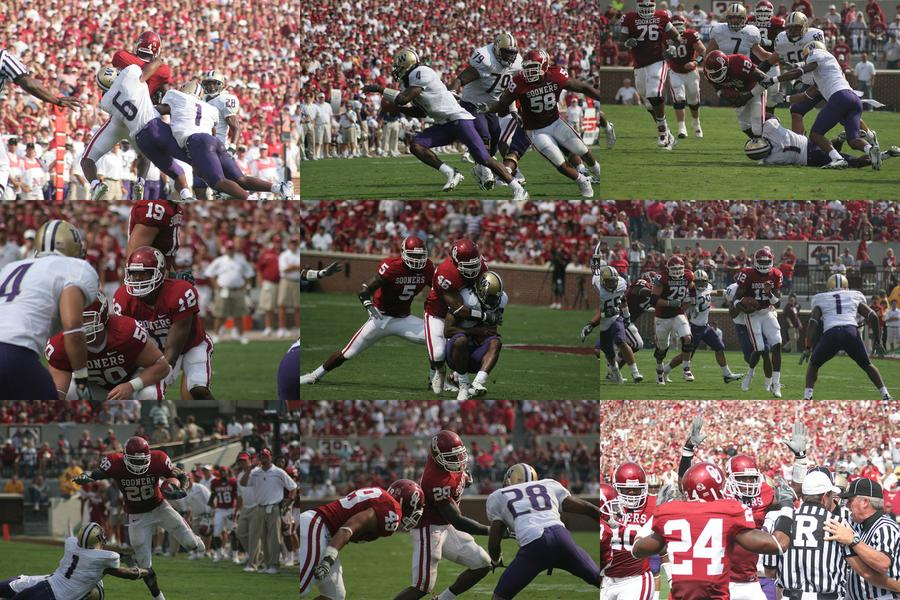
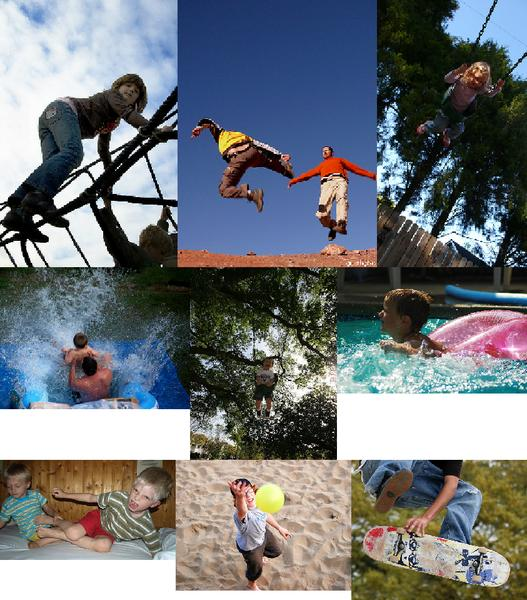
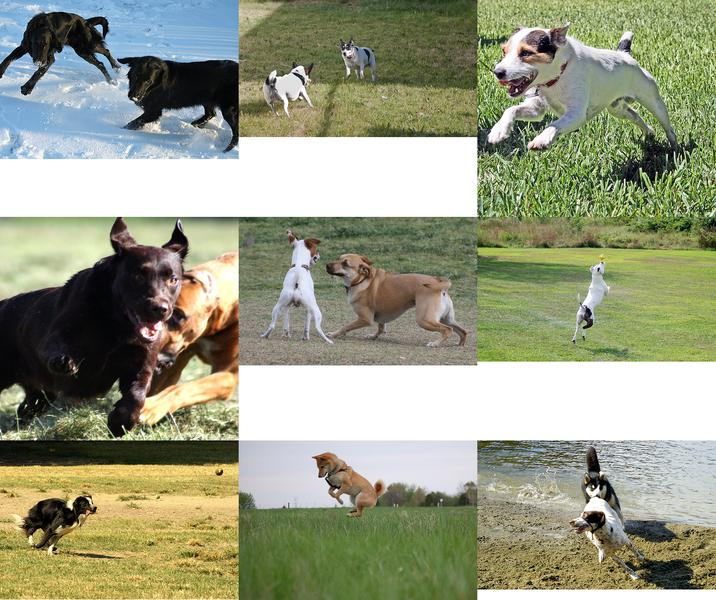

In [10]:
HTML(topic_extractor.display_topic_info_images())

100%|██████████████████████████████████████████████████████| 253/253 [06:18<00:00,  1.49s/it]


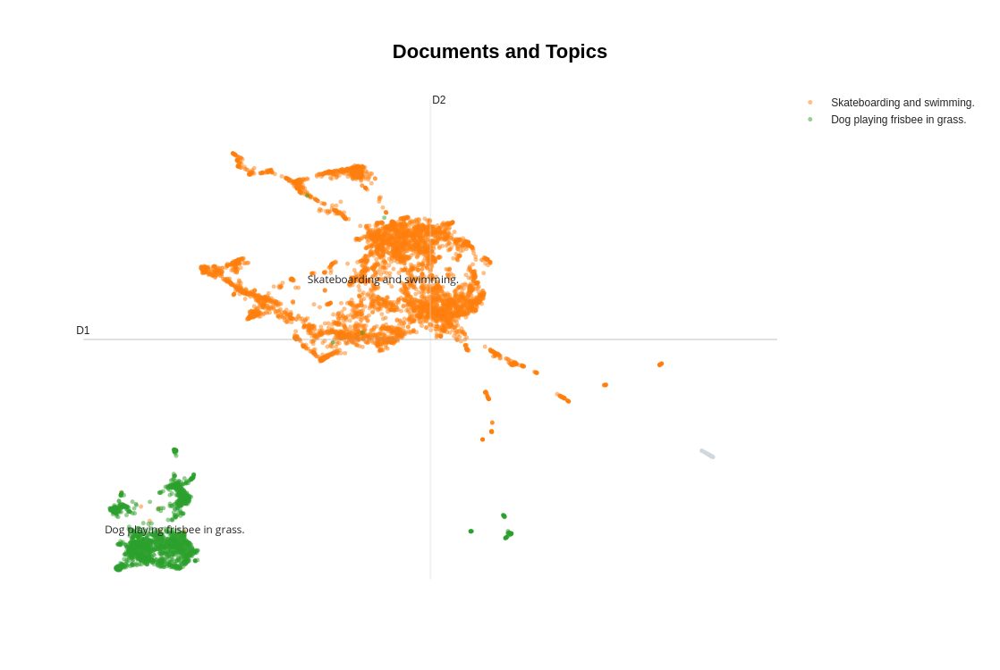

In [11]:
topic_extractor.visualize_2d_clusters(hide_document_hover = True, custom_labels = True)

100%|██████████████████████████████████████████████████████| 253/253 [06:10<00:00,  1.47s/it]


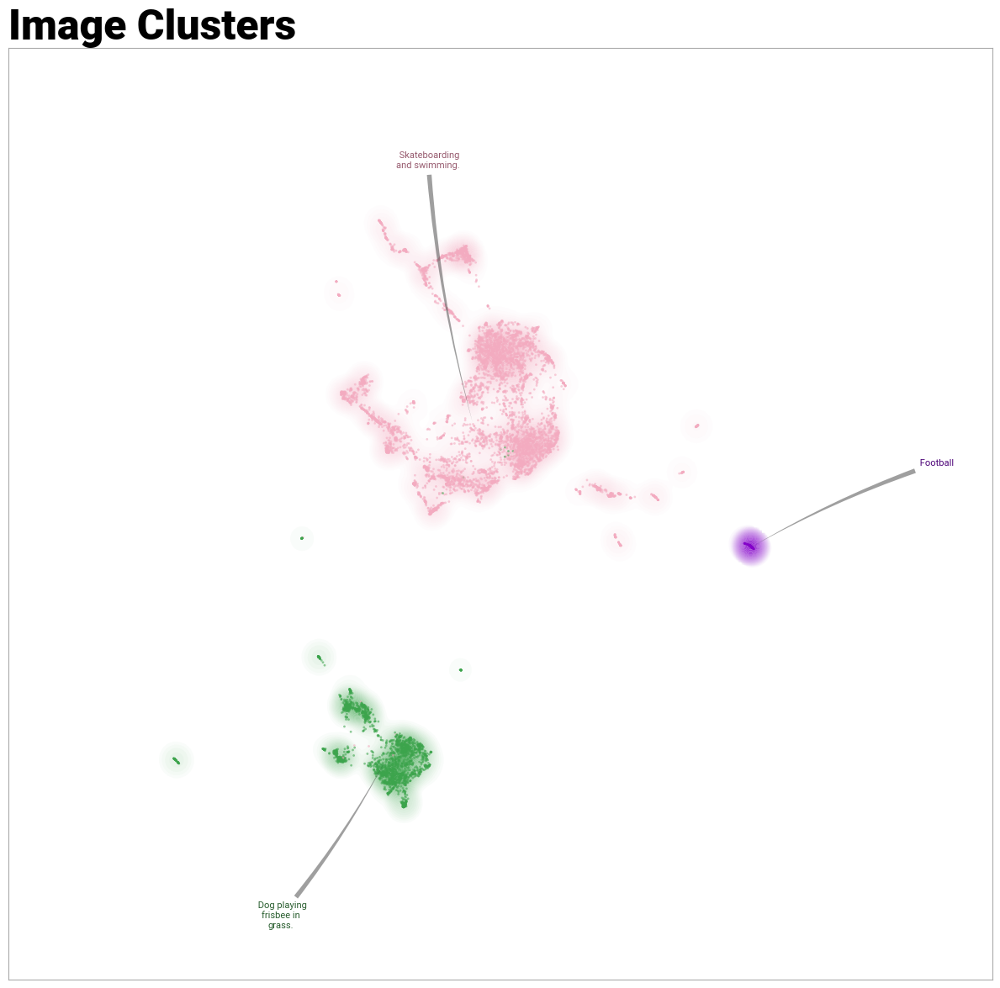

In [12]:
topic_extractor.datamap_plot()

## Retrieving the classification per image

In [13]:
document_df = topic_extractor.get_document_info()
display(document_df)

,Document,Topic,Name,CustomName,Representation,Visual_Aspect,Representative_Docs,Top_n_words,Probability,Representative_document
0,../../photos/Flicker8k_Dataset/69710415_5c2bfb...,0,0_is_the_in_air,Skateboarding and swimming.,"[is, the, in, air, skateboard, jumping, with, ...",<PIL.Image.Image image mode=RGB size=527x600 a...,"[a man jumping in the air with a frisbee , a p...",is - the - in - air - skateboard - jumping - w...,0.705669,False
1,../../photos/Flicker8k_Dataset/3044359043_6274...,1,1_dog_running_in_field,Dog playing frisbee in grass.,"[dog, running, in, field, grass, with, frisbee...",<PIL.Image.Image image mode=RGB size=716x600 a...,[a dog and a brown dog are playing in the gras...,dog - running - in - field - grass - with - fr...,0.433013,False
2,../../photos/Flicker8k_Dataset/1386964743_9e80...,0,0_is_the_in_air,Skateboarding and swimming.,"[is, the, in, air, skateboard, jumping, with, ...",<PIL.Image.Image image mode=RGB size=527x600 a...,"[a man jumping in the air with a frisbee , a p...",is - the - in - air - skateboard - jumping - w...,1.000000,False
3,../../photos/Flicker8k_Dataset/3523559027_a656...,0,0_is_the_in_air,Skateboarding and swimming.,"[is, the, in, air, skateboard, jumping, with, ...",<PIL.Image.Image image mode=RGB size=527x600 a...,"[a man jumping in the air with a frisbee , a p...",is - the - in - air - skateboard - jumping - w...,0.838584,False
4,../../photos/Flicker8k_Dataset/2632381125_de32...,1,1_dog_running_in_field,Dog playing frisbee in grass.,"[dog, running, in, field, grass, with, frisbee...",<PIL.Image.Image image mode=RGB size=716x600 a...,[a dog and a brown dog are playing in the gras...,dog - running - in - field - grass - with - fr...,0.518405,False
...,...,...,...,...,...,...,...,...,...,...
8086,../../photos/Flicker8k_Dataset/3380364224_2626...,0,0_is_the_in_air,Skateboarding and swimming.,"[is, the, in, air, skateboard, jumping, with, ...",<PIL.Image.Image image mode=RGB size=527x600 a...,"[a man jumping in the air with a frisbee , a p...",is - the - in - air - skateboard - jumping - w...,0.340152,False
8087,../../photos/Flicker8k_Dataset/2857558098_98e9...,1,1_dog_running_in_field,Dog playing frisbee in grass.,"[dog, running, in, field, grass, with, frisbee...",<PIL.Image.Image image mode=RGB size=716x600 a...,[a dog and a brown dog are playing in the gras...,dog - running - in - field - grass - with - fr...,0.991263,False
8088,../../photos/Flicker8k_Dataset/2930580341_d36e...,0,0_is_the_in_air,Skateboarding and swimming.,"[is, the, in, air, skateboard, jumping, with, ...",<PIL.Image.Image image mode=RGB size=527x600 a...,"[a man jumping in the air with a frisbee , a p...",is - the - in - air - skateboard - jumping - w...,0.721610,False
8089,../../photos/Flicker8k_Dataset/3165826902_6bf9...,0,0_is_the_in_air,Skateboarding and swimming.,"[is, the, in, air, skateboard, jumping, with, ...",<PIL.Image.Image image mode=RGB size=527x600 a...,"[a man jumping in the air with a frisbee , a p...",is - the - in - air - skateboard - jumping - w...,0.329122,False


# Custom min_cluster_size

In [14]:
from hdbscan import HDBSCAN 
#Changing the Cluster step. Code to load preprocessed embeddings
# load_folder = '../../saved_embeddings/'
# topic_extractor = Image_Topic_Extractor(img_list = images,
#                  embeddings = load_folder + 'embeddings.npy',
#                  reduced_embeddings = load_folder + 'reduced_embeddings.npy',
#                  reduced_embeddings_2d = load_folder + '2d_embeddings.npy',
#                 min_topic_size = 30
#                 )

topic_extractor = ImageTopicExtractor(img_list = images, min_topic_size = 30)
topic_extractor.fit(topic_explainer_pipe = topic_explainer_pipe)
description = topic_extractor.get_final_description(dataset_summary_pipe = dataset_summary_pipe, tokenizer = tokenizer)
print(description)


Could not find image processor class in the image processor config or the model config. Loading based on pattern matching with the model's feature extractor configuration. Please open a PR/issue to update `preprocessor_config.json` to use `image_processor_type` instead of `feature_extractor_type`. This warning will be removed in v4.40.
2024-05-03 13:29:06,993 - BERTopic - Embedding - Transforming documents to embeddings.
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 253/253 [06:01<00:00,  1.43s/it]
2024-05-03 13:35:08,911 - BERTopic - Embedding - Completed ✓
2024-05-03 13:35:08,912 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-05-03 13:35:17,097 - BERTopic - Dimensionality - Completed ✓
2024-05-03 13:35:17,098 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-05-03 13:35:17,280 - BERTopic - Cluster - Completed ✓
2024-05-03


         This dataset is an extensive collection of images, encompassing a wide variety of subjects and activities. The majority of the images (1691) fall under the category of "People on the Street," capturing everyday life and interactions among individuals in various urban environments. In addition, there are several smaller groups of images dedicated to specific themes such as pets (1290), children playing (1137), swimming (528), and snow-related activities (208). Other notable categories include skateboard tricks (319), rock climbing (107), surfing (100), horse and dog racing (95), dirt bike jumping (83), football (80), soccer (72), motorcycle racers (70), and baseball (59). These images provide a comprehensive overview of human interests and recreational activities.


## Visualizations


100%|██████████████████████████████████████████████████████| 253/253 [06:00<00:00,  1.43s/it]


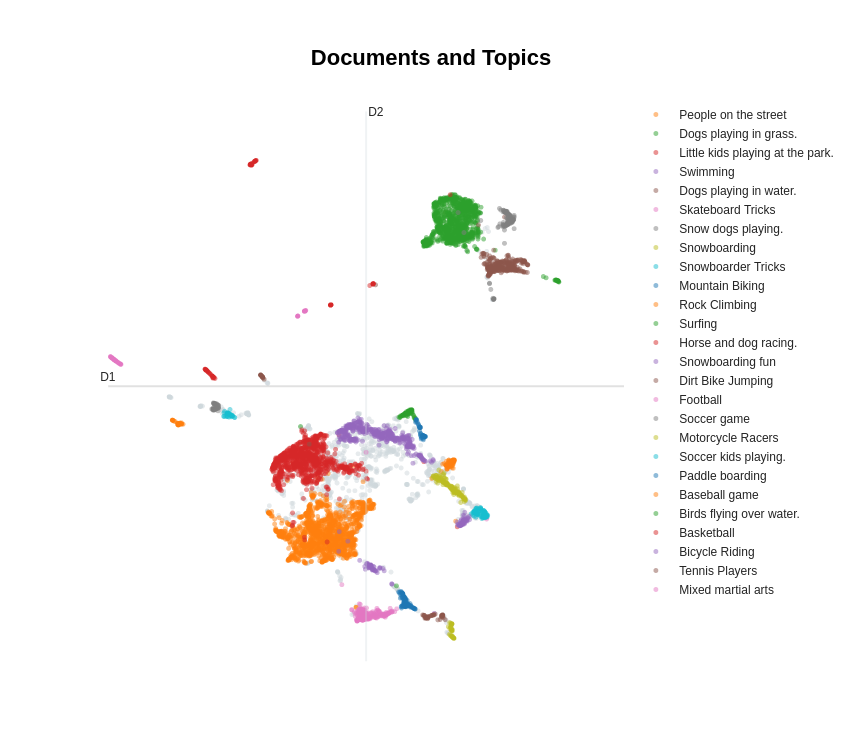

In [15]:
topic_extractor.visualize_2d_clusters(hide_document_hover = True, custom_labels = True, hide_annotations = True)

100%|██████████████████████████████████████████████████████| 253/253 [06:10<00:00,  1.46s/it]


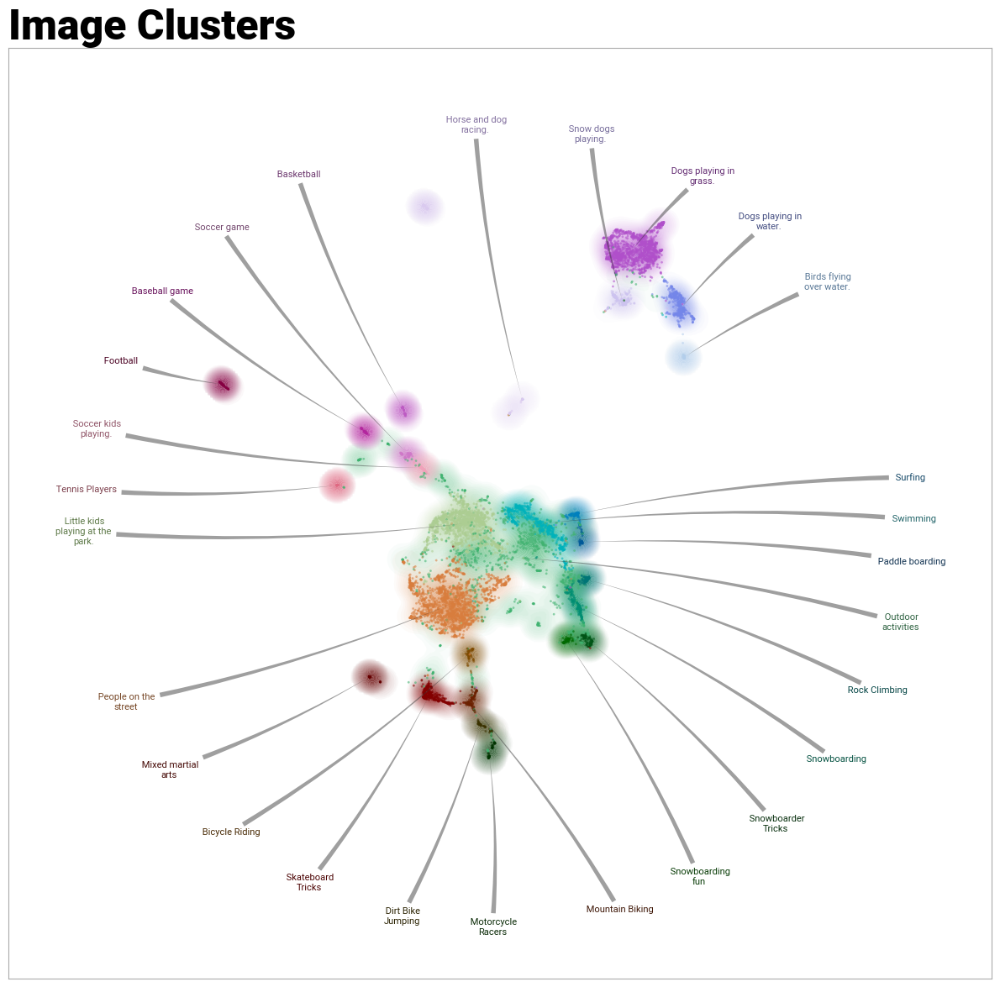

In [16]:
topic_extractor.datamap_plot()

In [17]:
df = topic_extractor.get_topic_info()
display(df)

,Topic,Count,Name,CustomName,Representation,Visual_Aspect,Representative_Docs
0,-1,969,-1_frisbee_air_jumping_hill,Outdoor activities,"[frisbee, air, jumping, hill, climbing, the, w...",<PIL.Image.Image image mode=RGB size=507x600 a...,"[a man jumping in the air to catch a frisbee ,..."
1,0,1691,0_bench_people_sitting_woman,People on the street,"[bench, people, sitting, woman, walking, stree...",<PIL.Image.Image image mode=RGB size=819x600 a...,[a woman is sitting on a bench with a group of...
2,1,1290,1_grass_running_dog_grassy,Dogs playing in grass.,"[grass, running, dog, grassy, field, across, t...",<PIL.Image.Image image mode=RGB size=792x600 a...,"[a dog running through a grassy field , a dog ..."
3,2,1137,2_boy_girl_little_holding,Little kids playing at the park.,"[boy, girl, little, holding, young, bed, umbre...",<PIL.Image.Image image mode=RGB size=529x600 a...,"[a boy and a girl are playing on a bed , a lit..."
4,3,528,3_water_boy_pool_in,Swimming,"[water, boy, pool, in, the, surfboard, with, l...",<PIL.Image.Image image mode=RGB size=580x600 a...,"[a young boy is in the pool with a toy , a lit..."
5,4,410,4_dog_frisbee_water_running,Dogs playing in water.,"[dog, frisbee, water, running, the, with, mout...",<PIL.Image.Image image mode=RGB size=657x600 a...,"[a dog in the water with a frisbee , a dog run..."
6,5,319,5_skateboard_ramp_doing_trick,Skateboard Tricks,"[skateboard, ramp, doing, trick, cement, skate...",<PIL.Image.Image image mode=RGB size=437x600 a...,"[a man riding a skateboard on top of a ramp , ..."
7,6,208,6_snow_dog_covered_running,Snow dogs playing.,"[snow, dog, covered, running, across, its, thr...",<PIL.Image.Image image mode=RGB size=763x600 a...,[a dog running through the snow with its tongu...
8,7,186,7_mountain_range_standing_person,Snowboarding,"[mountain, range, standing, person, slope, top...",<PIL.Image.Image image mode=RGB size=735x600 a...,"[a person on a snowboard on a mountain , a per..."
9,8,120,8_snowboarder_air_jump_mid,Snowboarder Tricks,"[snowboarder, air, jump, mid, doing, trick, sl...",<PIL.Image.Image image mode=RGB size=733x600 a...,[a snowboarder is doing a trick on a snow cove...


,Topic,Count,CustomName,Visual_Aspect
0,-1,969,Outdoor activities,
1,0,1691,People on the street,
2,1,1290,Dogs playing in grass.,
3,2,1137,Little kids playing at the park.,
4,3,528,Swimming,
5,4,410,Dogs playing in water.,
6,5,319,Skateboard Tricks,
7,6,208,Snow dogs playing.,
8,7,186,Snowboarding,
9,8,120,Snowboarder Tricks,

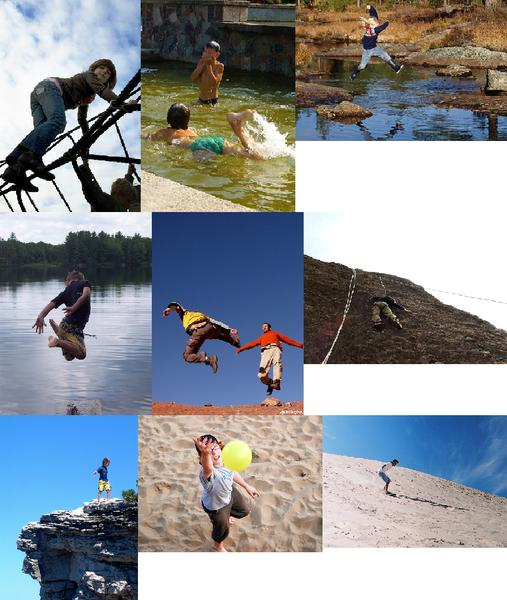
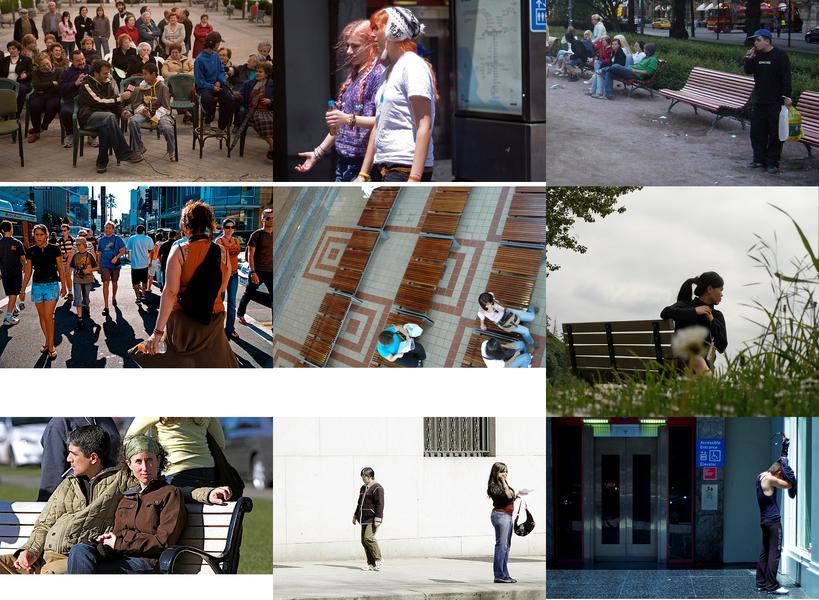
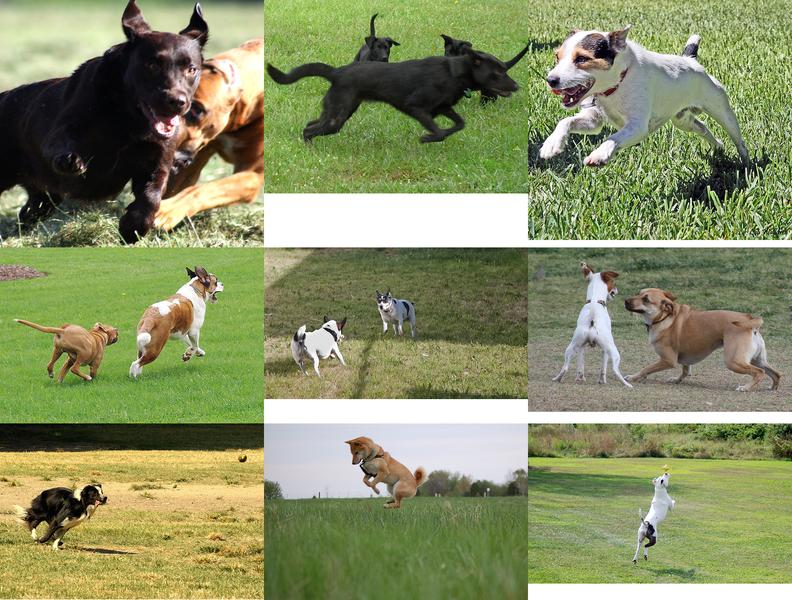
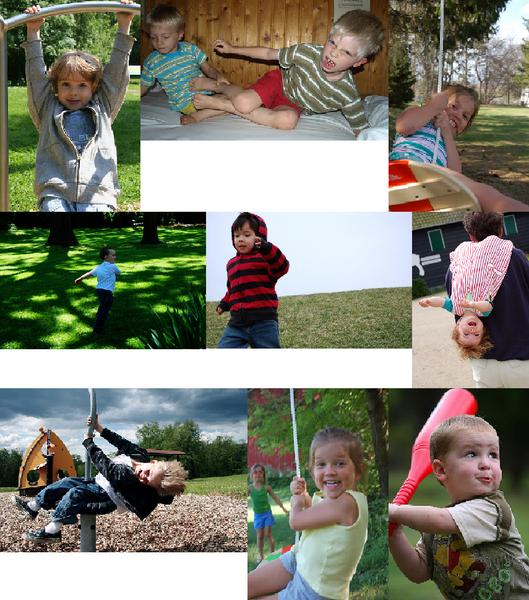
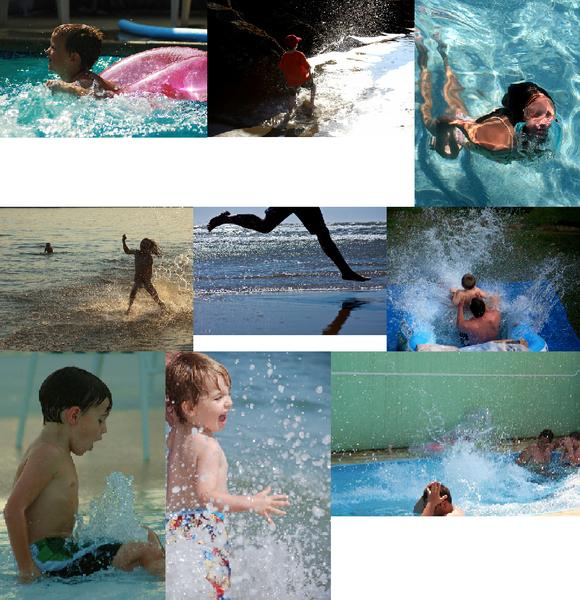
...
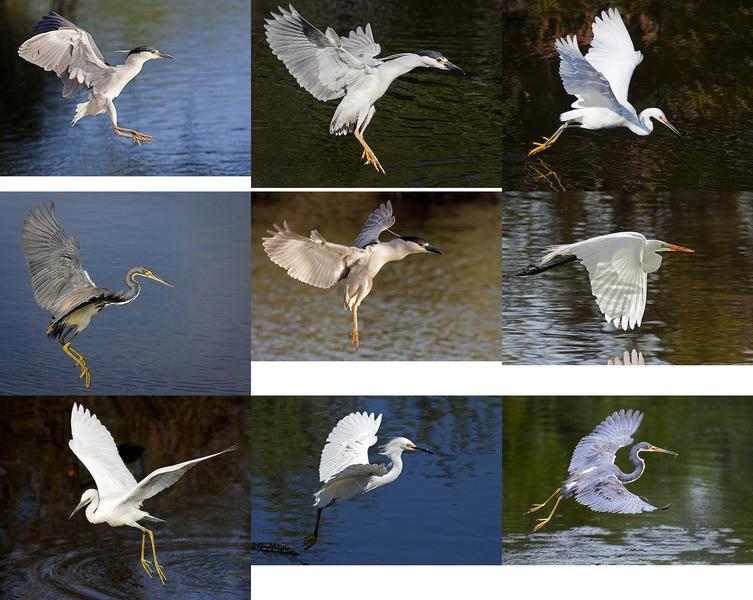
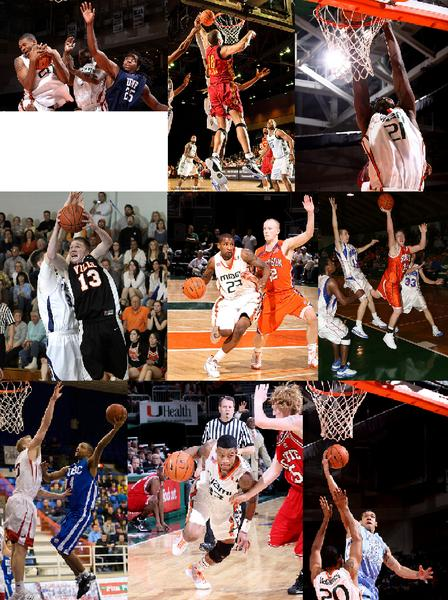
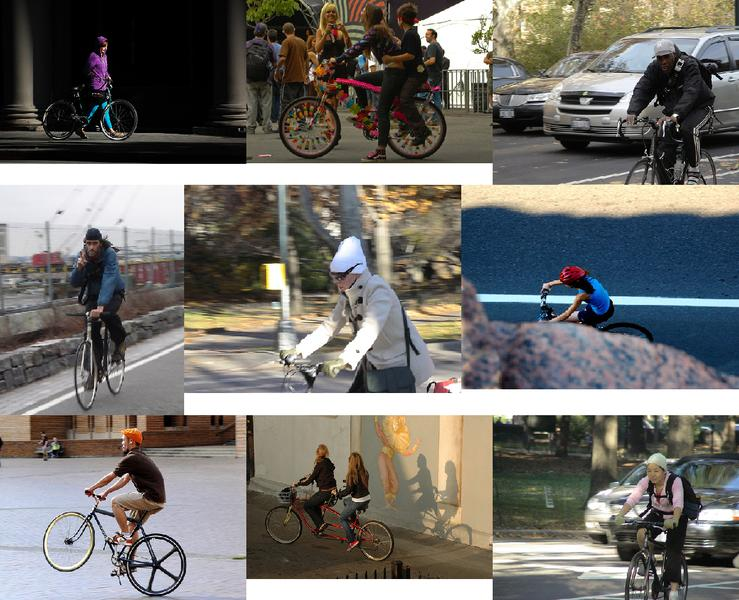
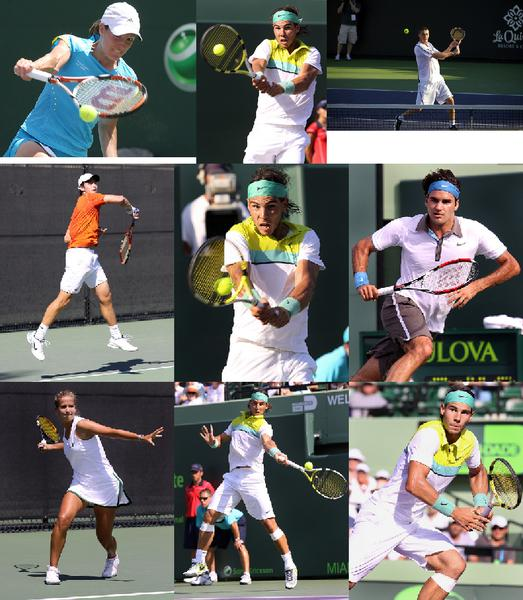
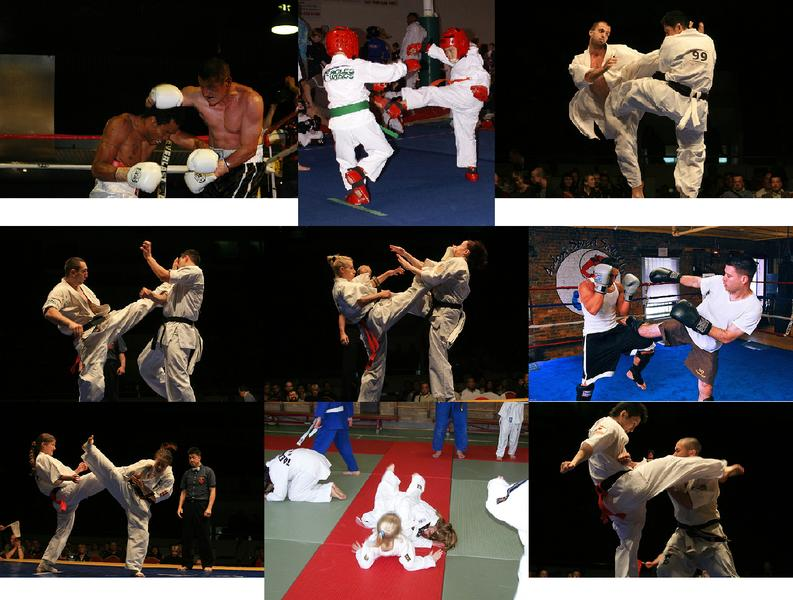

In [18]:
HTML(topic_extractor.display_topic_info_images())